This tutorial processes single cell intestine development data published by [Huycke et al., 2024](https://www.cell.com/cell/fulltext/S0092-8674(24)00465-3). Data can be downloaded from GEO https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE233407. The tutorial below starts from a prepared anndata object.

## Load data and package

In [38]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [42]:
import concord as ccd
import scanpy as sc
import torch
from pathlib import Path
import warnings
warnings.filterwarnings('ignore')

data_dir = Path("../../data/intestine_data")  # Replace with your data directory
data_path = data_dir / "adata_huycke.h5ad"
adata = sc.read(
    data_path
)
feature_list = ccd.ul.select_features(adata, n_top_features=5000, flavor='seurat_v3')
adata.layers["counts"] = adata.X.copy() # Back up raw counts as X will be modified
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
ccd.ul.score_cell_cycle(adata, organism='Mm') # Cell cycle scoring with CONCORD built in function

concord.utils.feature_selector - INFO - Selecting highly variable features with flavor seurat_v3...
concord - INFO - Processed 43 human genes to mouse orthologs.
concord - INFO - Processed 54 human genes to mouse orthologs.


In [43]:
import time
from pathlib import Path
proj_name = "concord_Huycke_intestine"
save_dir = f"../../save/dev_{proj_name}-{time.strftime('%b%d')}/"
save_dir = Path(save_dir)
save_dir.mkdir(parents=True, exist_ok=True)
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
file_suffix = f"{proj_name}_{time.strftime('%b%d')}"
seed = 0

## Run Concord

In [44]:
output_key = 'Concord'
# Here we use 'LaneID' as the domain/batch key, which indicates different 10x lanes. 
cur_ccd = ccd.Concord(adata=adata, input_feature=feature_list, domain_key='LaneID', 
                      latent_dim=50,
                      seed=seed, 
                      preload_dense=True,
                      verbose=True, 
                      device=device) 

# Encode data, saving the latent embedding in adata.obsm['Concord']
cur_ccd.fit_transform(output_key=output_key)

# [Optional] Save the latent embeddings to a file if needed 
ccd.ul.save_obsm_to_hdf5(cur_ccd.adata, save_dir / f"obsm_{file_suffix}.h5")

concord - INFO - Operating directly on the provided AnnData object. Object may be modified.
concord - INFO - Using NT-Xent loss with beta=1.0. This will apply hard-negative weighting to the contrastive loss.
concord - INFO - HCL (Contrastive learning with hard negative samples) mode is enabled.
concord - INFO - Column 'LaneID' is already of type: category
concord - INFO - Unused levels dropped for column 'LaneID'.
concord - INFO - Encoder input dim: 5000
concord - INFO - Model loaded to device: cpu
concord - INFO - Total number of parameters: 5053198
concord.model.dataloader - INFO - Using 0 DataLoader workers.
concord.model.dataloader - INFO - Filtering features with provided list (5000 features)...
concord.model.anndataset - INFO - Initialized lightweight dataset with 65468 samples.
concord.model.dataloader - INFO - Loading all data into memory for fast access. This may consume a lot of RAM. If you run out of memory, please set `preload_dense=False`.
concord - INFO - Augmentation pro

Epoch 0 Training: 100%|██████████| 252/252 [00:05<00:00, 43.40it/s, loss=5.238]

concord - INFO - Epoch   0 | Train Loss: 5.46, MSE: 0.00, CLASS: 0.00, CONTRAST: 5.46, IMPORTANCE: 0.00
concord - INFO - Starting epoch 2/15
concord - INFO - Processing chunk 1/1 for epoch 2
concord - INFO - Number of samples in train_dataloader: 65468



Epoch 1 Training: 100%|██████████| 252/252 [00:05<00:00, 43.99it/s, loss=5.184]

concord - INFO - Epoch   1 | Train Loss: 5.16, MSE: 0.00, CLASS: 0.00, CONTRAST: 5.16, IMPORTANCE: 0.00
concord - INFO - Starting epoch 3/15
concord - INFO - Processing chunk 1/1 for epoch 3


concord - INFO - Number of samples in train_dataloader: 65468


Epoch 2 Training: 100%|██████████| 252/252 [00:05<00:00, 43.80it/s, loss=5.006]

concord - INFO - Epoch   2 | Train Loss: 5.02, MSE: 0.00, CLASS: 0.00, CONTRAST: 5.02, IMPORTANCE: 0.00
concord - INFO - Starting epoch 4/15
concord - INFO - Processing chunk 1/1 for epoch 4
concord - INFO - Number of samples in train_dataloader: 65468



Epoch 3 Training: 100%|██████████| 252/252 [00:05<00:00, 43.19it/s, loss=4.852]

concord - INFO - Epoch   3 | Train Loss: 4.95, MSE: 0.00, CLASS: 0.00, CONTRAST: 4.95, IMPORTANCE: 0.00
concord - INFO - Starting epoch 5/15
concord - INFO - Processing chunk 1/1 for epoch 5
concord - INFO - Number of samples in train_dataloader: 65468



Epoch 4 Training: 100%|██████████| 252/252 [00:05<00:00, 43.93it/s, loss=4.898]

concord - INFO - Epoch   4 | Train Loss: 4.89, MSE: 0.00, CLASS: 0.00, CONTRAST: 4.89, IMPORTANCE: 0.00
concord - INFO - Starting epoch 6/15
concord - INFO - Processing chunk 1/1 for epoch 6
concord - INFO - Number of samples in train_dataloader: 65468



Epoch 5 Training: 100%|██████████| 252/252 [00:05<00:00, 44.58it/s, loss=4.822]

concord - INFO - Epoch   5 | Train Loss: 4.86, MSE: 0.00, CLASS: 0.00, CONTRAST: 4.86, IMPORTANCE: 0.00
concord - INFO - Starting epoch 7/15
concord - INFO - Processing chunk 1/1 for epoch 7
concord - INFO - Number of samples in train_dataloader: 65468



Epoch 6 Training: 100%|██████████| 252/252 [00:05<00:00, 44.40it/s, loss=4.787]

concord - INFO - Epoch   6 | Train Loss: 4.83, MSE: 0.00, CLASS: 0.00, CONTRAST: 4.83, IMPORTANCE: 0.00
concord - INFO - Starting epoch 8/15
concord - INFO - Processing chunk 1/1 for epoch 8
concord - INFO - Number of samples in train_dataloader: 65468



Epoch 7 Training: 100%|██████████| 252/252 [00:05<00:00, 44.26it/s, loss=4.945]

concord - INFO - Epoch   7 | Train Loss: 4.80, MSE: 0.00, CLASS: 0.00, CONTRAST: 4.80, IMPORTANCE: 0.00
concord - INFO - Starting epoch 9/15
concord - INFO - Processing chunk 1/1 for epoch 9
concord - INFO - Number of samples in train_dataloader: 65468



Epoch 8 Training: 100%|██████████| 252/252 [00:05<00:00, 43.07it/s, loss=4.741]

concord - INFO - Epoch   8 | Train Loss: 4.77, MSE: 0.00, CLASS: 0.00, CONTRAST: 4.77, IMPORTANCE: 0.00


concord - INFO - Starting epoch 10/15
concord - INFO - Processing chunk 1/1 for epoch 10
concord - INFO - Number of samples in train_dataloader: 65468


Epoch 9 Training: 100%|██████████| 252/252 [00:05<00:00, 44.32it/s, loss=4.742]

concord - INFO - Epoch   9 | Train Loss: 4.76, MSE: 0.00, CLASS: 0.00, CONTRAST: 4.76, IMPORTANCE: 0.00
concord - INFO - Starting epoch 11/15
concord - INFO - Processing chunk 1/1 for epoch 11
concord - INFO - Number of samples in train_dataloader: 65468



Epoch 10 Training: 100%|██████████| 252/252 [00:05<00:00, 45.16it/s, loss=4.638]

concord - INFO - Epoch  10 | Train Loss: 4.74, MSE: 0.00, CLASS: 0.00, CONTRAST: 4.74, IMPORTANCE: 0.00
concord - INFO - Starting epoch 12/15
concord - INFO - Processing chunk 1/1 for epoch 12
concord - INFO - Number of samples in train_dataloader: 65468



Epoch 11 Training: 100%|██████████| 252/252 [00:05<00:00, 44.22it/s, loss=4.631]

concord - INFO - Epoch  11 | Train Loss: 4.73, MSE: 0.00, CLASS: 0.00, CONTRAST: 4.73, IMPORTANCE: 0.00
concord - INFO - Starting epoch 13/15
concord - INFO - Processing chunk 1/1 for epoch 13
concord - INFO - Number of samples in train_dataloader: 65468



Epoch 12 Training: 100%|██████████| 252/252 [00:05<00:00, 43.75it/s, loss=4.685]

concord - INFO - Epoch  12 | Train Loss: 4.72, MSE: 0.00, CLASS: 0.00, CONTRAST: 4.72, IMPORTANCE: 0.00
concord - INFO - Starting epoch 14/15
concord - INFO - Processing chunk 1/1 for epoch 14
concord - INFO - Number of samples in train_dataloader: 65468



Epoch 13 Training: 100%|██████████| 252/252 [00:06<00:00, 41.72it/s, loss=4.658]

concord - INFO - Epoch  13 | Train Loss: 4.70, MSE: 0.00, CLASS: 0.00, CONTRAST: 4.70, IMPORTANCE: 0.00
concord - INFO - Starting epoch 15/15
concord - INFO - Processing chunk 1/1 for epoch 15
concord - INFO - Number of samples in train_dataloader: 65468



Epoch 14 Training: 100%|██████████| 252/252 [00:05<00:00, 43.35it/s, loss=4.656]

concord - INFO - Epoch  14 | Train Loss: 4.69, MSE: 0.00, CLASS: 0.00, CONTRAST: 4.69, IMPORTANCE: 0.00


concord - INFO - Model saved to save/final_model_Sep10-1224.pt
concord - INFO - Final model saved at: save/final_model_Sep10-1224.pt; Configuration saved at: save/config_Sep10-1224.json.
concord.model.dataloader - INFO - Using 0 DataLoader workers.
concord.model.dataloader - INFO - Filtering features with provided list (5000 features)...
concord.model.anndataset - INFO - Initialized lightweight dataset with 65468 samples.
concord.model.dataloader - INFO - Loading all data into memory for fast access. This may consume a lot of RAM. If you run out of memory, please set `preload_dense=False`.
concord - INFO - Predicting for chunk 1/1
concord - INFO - Predictions added to AnnData object with base key 'Concord'.


## Visualize Concord latent with UMAP

### 2D UMAP

Concord supports custom color palettes, you can provide these palettes with example code below (Note some of the annotations, such as broad_cell_type was preliminary annotations by us not by the authors). 

In [47]:
# Define color palette
adata.obs['stage'] = adata.obs['MouseAge_combined']
_, _, ct_pal = ccd.pl.get_color_mapping(adata, 'broad_cell_type', pal='tab20', seed=seed)
_, _, mes_pal = ccd.pl.get_color_mapping(adata, 'mes_subtype', pal='Paired', seed=seed)
_, _, phase_pal = ccd.pl.get_color_mapping(adata, 'phase', pal='Set1', seed=seed)
_, _, seg_pal = ccd.pl.get_color_mapping(adata, 'seg_classify', pal='tab10', seed=seed)
_, _, lane_pal = ccd.pl.get_color_mapping(adata,'LaneID', pal='Paired', seed=7)
stage_pal = {
    '12.5':"midnightblue", 
    '13.5':"dodgerblue", 
    '14.5':"seagreen", 
    '15.5':"#00C000", 
    '16.5':"#EEC900", 
    '17.5':"#FF7F00", 
    '18.5':"#FF0000"
}
pal = {
    "broad_cell_type": ct_pal,
    "mes_subtype": mes_pal,
    'phase': phase_pal,
    'stage': stage_pal,
    'seg_classify': seg_pal,
    'LaneID': lane_pal}

concord - INFO - UMAP embedding stored in adata.obsm['Concord_UMAP']


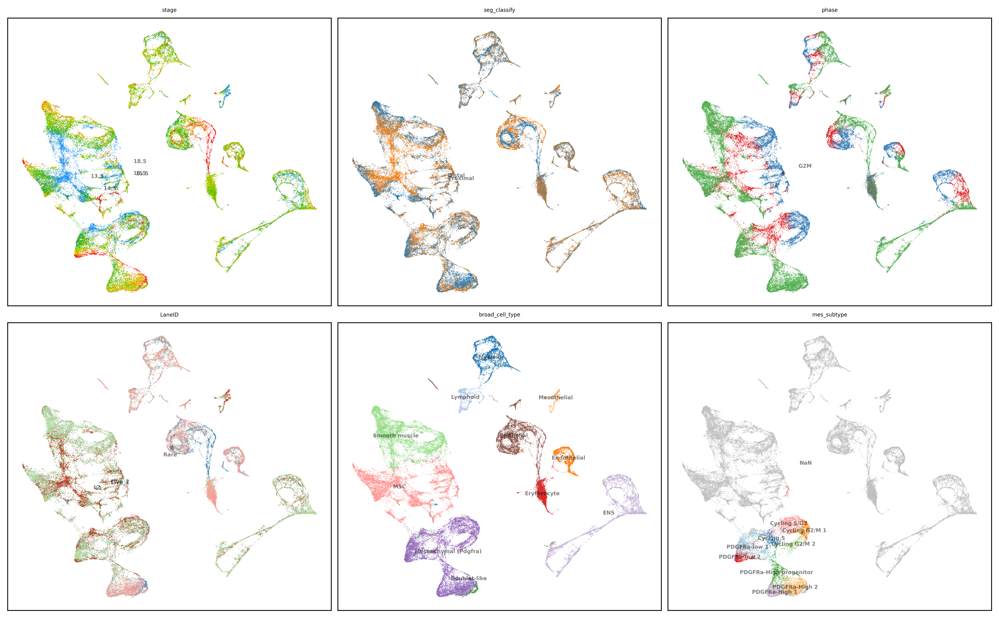

In [49]:
ccd.ul.run_umap(adata, source_key=output_key, result_key=f'{output_key}_UMAP', n_components=2, n_neighbors=30, min_dist=0.1, metric='euclidean', random_state=seed)
show_basis = f'{output_key}_UMAP'
show_cols = ['stage', 'seg_classify', 'phase', 'LaneID', 'broad_cell_type', "mes_subtype"]
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(13,8), dpi=600, ncols=3, font_size=5, point_size=1, legend_loc='on data',
    pal=pal,
    save_path=save_dir / f"{show_basis}_{file_suffix}.png"
)

### 3D UMAP

It is best to use 3D UMAP rather than 2D to visualize Concord latent, because 2D may not be enough to 'unpack' the complex structures learned by Concord, thus tends to break trajectories.

In [53]:
ccd.ul.run_umap(adata,  source_key=output_key, result_key=f'{output_key}_UMAP_3D', n_components=3, n_neighbors=30, min_dist=0.1, metric='euclidean')
# Plot the 3D UMAP embeddings
show_basis = f'{output_key}_UMAP_3D'
for col in ['stage', 'phase','broad_cell_type']:
    fig = ccd.pl.plot_embedding_3d(
            adata, basis=show_basis, color_by=col,
            pal=pal,
            save_path=save_dir / f'{show_basis}_{file_suffix}.html',
            point_size=1, opacity=0.8, width=1500, height=1000
        )

concord - INFO - UMAP embedding stored in adata.obsm['Concord_UMAP_3D']
concord.plotting.pl_embedding - INFO - 3D plot saved to ../../save/dev_concord_Huycke_intestine-Sep10/Concord_UMAP_3D_concord_Huycke_intestine_Sep10_stage.html


concord.plotting.pl_embedding - INFO - 3D plot saved to ../../save/dev_concord_Huycke_intestine-Sep10/Concord_UMAP_3D_concord_Huycke_intestine_Sep10_phase.html


concord.plotting.pl_embedding - INFO - 3D plot saved to ../../save/dev_concord_Huycke_intestine-Sep10/Concord_UMAP_3D_concord_Huycke_intestine_Sep10_broad_cell_type.html


We can just visualize the Mesenchmal cell (Pdgfra hi/lo) subset, note the loop of cell cycle and the differentiation from Pdgfra-lo to Pdgfra-hi cells.

In [52]:
col = 'mes_subtype'
show_basis = f'{output_key}_UMAP_3D'
fig = ccd.pl.plot_embedding_3d(
        adata, basis=show_basis, color_by=col,
        save_path=save_dir / f'{show_basis}_{file_suffix}.html',
        point_size=1, opacity=0.8, width=1500, height=800
    )

concord.plotting.pl_embedding - INFO - 3D plot saved to ../../save/dev_concord_Huycke_intestine-Sep10/Concord_UMAP_3D_concord_Huycke_intestine_Sep10_mes_subtype.html


Because CONCORD learns detailed structures of each cell type, you can directly subset and compute "zoom-in" UMAPs with code below. Alternatively, re-running both CONCORD and UMAP on subset could yield better "zoom-in" result.

In [54]:
adata_subset = adata[adata.obs['broad_cell_type'].isin(['Mesenchymal (Pdgfra)'])].copy()
adata_subset.shape

(13466, 18701)

In [58]:
ccd.ul.run_umap(adata_subset,  source_key=output_key, result_key=f'{output_key}_UMAP_3D', n_components=3, n_neighbors=30, min_dist=0.1, metric='euclidean')
# Plot the 3D UMAP embeddings
show_basis = f'{output_key}_UMAP_3D'
for col in ['mes_subtype']:
    fig = ccd.pl.plot_embedding_3d(
            adata_subset, basis=show_basis, color_by=col,
            pal=pal,
            save_path=save_dir / f'{show_basis}_{file_suffix}.html',
            point_size=3, opacity=0.8, width=1500, height=1000
        )

concord - INFO - UMAP embedding stored in adata.obsm['Concord_UMAP_3D']
concord.plotting.pl_embedding - INFO - 3D plot saved to ../../save/dev_concord_Huycke_intestine-Sep10/Concord_UMAP_3D_concord_Huycke_intestine_Sep10_mes_subtype.html


## Save the result

In [59]:
adata.write_h5ad(data_dir / f"adata_{file_suffix}.h5ad")

You can optionally convert the result to VisCello (https://github.com/kimpenn/VisCello) for interactive exploration. You will need to install `rpy2` in python and `VisCello` in R (https://github.com/kimpenn/VisCello).

In [60]:
ccd.ul.anndata_to_viscello(adata, save_dir / f"cello_{proj_name}_{file_suffix}", project_name = proj_name, organism='mmu')

VisCello project created at ../../save/dev_concord_Huycke_intestine-Sep10/cello_concord_Huycke_intestine_concord_Huycke_intestine_Sep10
